In [1]:
import numpy as np
import os
import sys
import pandas as pd
import seaborn as sns

import pylab as pl
import h5py

import tensorflow as tf
from tensorflow.keras import mixed_precision

os.environ['TF_CPP_MIN_LOG_LEVEL']='2'
os.environ['CUDA_VISIBLE_DEVICES']="0" 

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)


from sklearn.metrics import confusion_matrix

base_dir = '/media/tord/T7/Thesis_ssd/MasterThesis3'
os.chdir(base_dir)
from Classes.DataProcessing.LoadData import LoadData
from Classes.DataProcessing.HelperFunctions import HelperFunctions
from Classes.DataProcessing.DataHandler import DataHandler
from Classes.Modeling.DynamicModels import DynamicModels
from Classes.Modeling.TrainSingleModelRam import TrainSingleModelRam
from Classes.DataProcessing.RamLoader import RamLoader
import json

import gc

import datetime
import re
from livelossplot import PlotLossesKeras
from GlobalUtils import GlobalUtils
from Classes.Modeling.CustomCallback import CustomCallback
from tensorflow.keras.callbacks import EarlyStopping
utils = GlobalUtils()

from tensorflow.keras.utils import GeneratorEnqueuer






import sys


helper = HelperFunctions()

tf.config.optimizer.set_jit(True)
mixed_precision.set_global_policy('mixed_float16')

1 Physical GPUs, 1 Logical GPUs

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: GeForce RTX 3090, compute capability 8.6


In [2]:
load_args = {
    'earth_explo_only' : False,
    'noise_earth_only' : False,
    'noise_not_noise' : True,
    'downsample' : True,
    'upsample' : True,
    'frac_diff' : 1,
    'seed' : 1,
    'subsample_size' : 0.25,
    'balance_non_train_set' : False,
    'use_true_test_set' : False,
    'even_balance' : True
}
loadData = LoadData(**load_args)
train_ds, val_ds, test_ds = loadData.get_datasets()
noise_ds = loadData.noise_ds
handler = DataHandler(loadData)



2 3
Balancing due to disguised labels.
This functions barely works, and is a piece of shit that should not be trusted. Only works because noise has id: 0
{'noise': 84799, 'earthquake': 84799, 'explosion': 82246}
Mapping train redundancy: : [--------------------------------------->] 100 %

Mapping validation redundancy: : [--------------------------------------->] 100 %

Mapping test redundancy: : [--------------------------------------->] 100 %



Loaded noise non-noise dataset.
Evenly balanced among classes in the train set.
Distribution (Label: (counts, proportion)) of
Train ds:
earthquake: (10631, 0.2526)  |  explosion: (10106, 0.2402)  |  noise: (21343, 0.5072)  
Val ds:
earthquake: (242, 0.0371)  |  explosion: (3125, 0.4788)  |  noise: (3160, 0.4841)  
Test ds:
earthquake: (184, 0.0423)  |  explosion: (2062, 0.4739)  |  noise: (2105, 0.4838)  


In [3]:
model_type = "LSTM"
is_lstm = True
num_channels = 3    

use_time_augmentor = True
scaler_name = "standard"
use_noise_augmentor = True
filter_name = None
band_min = 2.0
band_max = 4.0
highpass_freq = 0.075

shutdown = False

num_classes = len(list(set(loadData.label_dict.values())))



ramLoader = RamLoader(loadData, 
                      handler, 
                      use_time_augmentor = use_time_augmentor, 
                      use_noise_augmentor = use_noise_augmentor, 
                      scaler_name = scaler_name,
                      filter_name = filter_name, 
                      band_min = band_min,
                      band_max = band_max,
                      highpass_freq = highpass_freq, 
                      load_test_set = False, 
                      meier_load = False)

x_train, y_train, x_val, y_val, noiseAug = ramLoader.load_to_ram()

Fitting train time augmentor: [--------------------------------------->] 100 %

Fit process completed after 16.026251554489136 seconds. Total datapoints fitted: 42080.
Average time per datapoint: 0.0003808519856104833




Fitting validation time augmentor: [--------------------------------------->] 100 %

Fit process completed after 2.9875216484069824 seconds. Total datapoints fitted: 6527.
Average time per datapoint: 0.0004577174273643301




Stage one loading training set, timeAug: [--------------------------------------->] 100 %



Stage one loading validation set, timeAug: [--------------------------------------->] 100 %



Fitting scaler progress: [------------------->] 100 %



Stage two loading training set, labels and standard scaler: [--------------------------------------->] 100 %



Stage two loading validation set, labels and standard scaler: [--------------------------------------->] 100 %

(array([    4,     5,     6, ..., 42071, 42073, 42075]), array([0, 0, 0, ..., 0, 0, 0]))


Fitting noise augmentor: [--------------------------------------->] 100 %



Time elapsed to completion of load_to_ram_noise_not_noise: 0:01:13.086940


[]
Trying to create result file
Made result file:  results_LSTM_baseline_noiseNotNoise_timeAug_standard_noiseAug_earlyS_unbalanced_valtest_subsample-0.25_numChannels-3.csv
[   {'model_type': 'LSTM_baseline'},
    {   'batch_size': 128,
        'epochs': 50,
        'learning_rate': 0.01,
        'optimizer': 'sgd',
        'output_layer_activation': 'sigmoid',
        'units': 1}]
Saving file. 1 rows.
results_LSTM_baseline_noiseNotNoise_timeAug_standard_noiseAug_earlyS_unbalanced_valtest_subsample-0.25_numChannels-3.csv saved to path:   /media/tord/T7/Thesis_ssd/MasterThesis3/GridSearchResults/2_classes
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 6000, 3)]         0         
_________________________________________________________________
cu_dnnlstm (CuDNNLSTM)       (None, 1)                 24        
____________________________________________

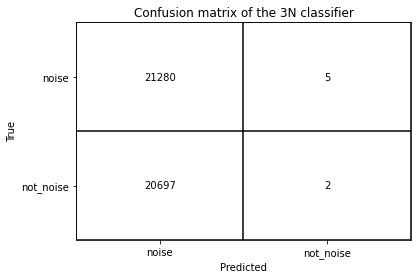

<tf.Tensor: shape=(2, 2), dtype=int32, numpy=
array([[21280,     5],
       [20697,     2]], dtype=int32)>
              precision    recall  f1-score   support

       noise       0.51      1.00      0.67     21285
   not_noise       0.29      0.00      0.00     20699

    accuracy                           0.51     41984
   macro avg       0.40      0.50      0.34     41984
weighted avg       0.40      0.51      0.34     41984

Unsaved val eval:
3100 0 3299 1
['noise', 'not_noise']
3N


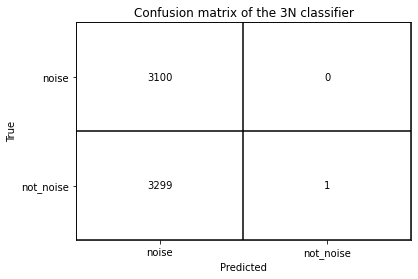

<tf.Tensor: shape=(2, 2), dtype=int32, numpy=
array([[3100,    0],
       [3299,    1]], dtype=int32)>
              precision    recall  f1-score   support

       noise       0.48      1.00      0.65      3100
   not_noise       1.00      0.00      0.00      3300

    accuracy                           0.48      6400
   macro avg       0.74      0.50      0.33      6400
weighted avg       0.75      0.48      0.32      6400



In [5]:
use_tensorboard = True
use_liveplots = False
use_custom_callback = True
use_early_stopping = True
start_from_scratch = False
use_reduced_lr = True
log_data = True
model_type = "LSTM_baseline"

beta = 1

def clear_tensorboard_dir():
        import os
        import shutil
        path = f"{base_dir}/Tensorboard_dir/fit"
        files = os.listdir(path)
        print(files)
        for f in files:
            shutil.rmtree(os.path.join(path,f))
if use_tensorboard:
    clear_tensorboard_dir()


modelTrain = TrainSingleModelRam(noiseAug, helper,
                              loadData, model_type, num_channels, use_tensorboard, use_liveplots,
                              use_custom_callback, use_early_stopping, use_reduced_lr, ramLoader,
                              log_data = log_data, 
                              start_from_scratch = start_from_scratch, beta = beta)

params = {
        "batch_size" : 128,
        "epochs" : 50,
        "learning_rate" : 0.01,
        "optimizer" : "sgd",
        "units" : 1,
        "output_layer_activation" : "sigmoid"
    }
model = modelTrain.run(x_train, y_train, x_val, y_val, None, None, 16, 15, evaluate_train = True, evaluate_val = True, evaluate_test = False, meier_mode = False, **params)

3100 0 3299 1


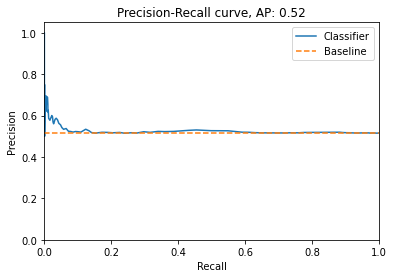

['noise', 'not_noise']
3N


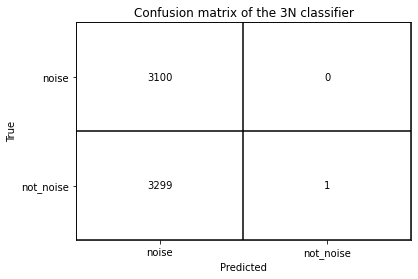

<tf.Tensor: shape=(2, 2), dtype=int32, numpy=
array([[3100,    0],
       [3299,    1]], dtype=int32)>
              precision    recall  f1-score   support

       noise       0.48      1.00      0.65      3100
   not_noise       1.00      0.00      0.00      3300

    accuracy                           0.48      6400
   macro avg       0.74      0.50      0.33      6400
weighted avg       0.75      0.48      0.32      6400



In [6]:
conf, report, accuracy, precision, recall, fscore = helper.evaluate_generator(model, x_val, y_val, params["batch_size"],
                                                                             loadData.label_dict, num_channels, noiseAug,
                                                                             scaler_name, 2, plot_conf_matrix = True, plot_p_r_curve = True, beta = beta)

In [7]:
accuracy, precision, recall, fscore

(0.48453125000000002, 1.0, 0.00030299999999999999, 0.00060599999999999998)

In [ ]:
model.summary()

In [ ]:
save_dir = '/media/tord/T7/Thesis_ssd/SavedModels/LSTM'
model_name = 'LSTM_baseline_3N_final'
model_path = f'{save_dir}/{model_name}'

model.save(model_path)
#model = helper.load_model(model_path)

In [ ]:
def get_false_negative_indexes(rounded_predictions, y_test):
    false_negative_indexes = []
    for i in range(len(rounded_predictions)):
        if y_test[i] == 1 and rounded_predictions[i] == 0:
            false_negative_indexes.append(i)
    return false_negative_indexes

def get_false_positive_indexes(rounded_predictions, y_test):
    false_positive_indexes = []
    for i in range(len(rounded_predictions)):
        if y_test[i] == 0 and rounded_predictions[i] == 1:
            false_positive_indexes.append(i)
    return false_positive_indexes

def get_true_positive_indexes(rouneded_predictions, y_test):
    true_positive_indexes = []
    for i in range(len(rounded_predictions)):
        if y_test[i] == 1 and rounded_predictions[i] == 1:
            true_positive_indexes.append(i)
    return true_positive_indexes

def get_true_negative_indexes(rouneded_predictions, y_test):
    true_negative_indexes = []
    for i in range(len(rounded_predictions)):
        if y_test[i] == 0 and rounded_predictions[i] == 0:
            true_negative_indexes.append(i)
    return true_negative_indexes

predictions = helper.predict_RamGenerator(model, x_val, y_val, params["batch_size"], True, noiseAug, loadData.label_dict, 3)
rounded_predictions = np.rint(predictions)
y = y_val


false_negatives_indexes = get_false_negative_indexes(rounded_predictions, y)
false_positives_indexes = get_false_positive_indexes(rounded_predictions, y)
true_negative_indexes = get_true_negative_indexes(rounded_predictions, y)
true_positive_indexes = get_true_positive_indexes(rounded_predictions, y)

# True Positive

In [ ]:
import pprint
i = 0
pp = pprint.PrettyPrinter(indent = 4)

In [ ]:
index = true_positive_indexes[i]
original_trace, sample_info = handler.path_to_trace(val_ds[index][0])
transformed_trace = x_val[index]
print(f"Predicted label: {predictions[index]}, Correct: {y_val[index]}")
print("Transformed")
helper.plot_event(transformed_trace, sample_info)
helper.plot_event(original_trace, sample_info)
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(sample_info)
i += 1

# False Positive

In [ ]:
j = 0

In [ ]:
# Plotting false negative
index = false_positives_indexes[j]
original_trace, sample_info = handler.path_to_trace(val_ds[index][0])
transformed_trace = x_val[index]
print(f"Predicted label: {predictions[index]}, Correct: {y_val[index]}")
print("Transformed")
print(j)
helper.plot_event(transformed_trace, sample_info)
helper.plot_event(original_trace, sample_info)
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(sample_info)
j += 1

# True Negative

In [ ]:
k = 0

In [ ]:
# Plotting true negative
index = true_negative_indexes[k]
original_trace, sample_info = handler.path_to_trace(val_ds[index][0])
transformed_trace = x_val[index]
print(f"Predicted label: {predictions[index]}, Correct: {y_val[index]}")
print("Transformed")
helper.plot_event(transformed_trace, sample_info)
helper.plot_event(original_trace, sample_info)
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(sample_info)
k += 1

# False Negative

In [ ]:
m = 0

In [ ]:
# Plotting false negative
index = false_negatives_indexes[m]
original_trace, sample_info = handler.path_to_trace(val_ds[index][0])
transformed_trace = x_val[index]
print(f"Predicted label: {predictions[index]}, Correct: {y_val[index]}")
print("Transformed")
print(m)
helper.plot_event(transformed_trace, sample_info)
helper.plot_event(original_trace, sample_info)
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(sample_info)
m += 1